## Image Labelling in Real Estate

We have a dataset of images representing different rooms of houses. Unfortunately, the data we have is unlabelled and domain specific (real estate), using pretrained convolutional networks  on general labelled images did not yield satisfactory labels. To try and overcome the problem, we chain together different algorithms to come up with labels for our image datasets.

In this notebook, I will use GraphLab Create to extract features from a pretrained AlexNet convolutional network. Using these features, I will build a similarity graph based on cosine similarity between images. I will then use K-Means clustering and PageRank to curate the labels of a few representative images, which then we can derive labels for the remaining images in the dataset.

### Importing dependencies and uploading data

In [ ]:
import graphlab as gl
import networkx as nx
from matplotlib.pyplot import *
gl.canvas.set_target('ipynb')
%matplotlib inline

We will begin by uploading the image dataset which is stored locally as an SFrame. The SFrame has 3 columns representing image id, the image itself, and the deep features extracted by the AlexNet model. 

Note that extracting these features takes time on a CPU (GraphLab Create supports GPU's for faster computations, but this is outside the scope of this demo), and therefore I do it before hand and store them in the column 'features'. The code to extract the features is given below but commneted out. 

In [4]:
images = gl.SFrame('/Users/data/realestate/images.sf/')
images.print_rows(5)

+------+------------------------+-------------------------------+
| __id |         image          |            features           |
+------+------------------------+-------------------------------+
|  19  | Height: 256 Width: 256 | [0.0, 2.71719360352, 0.291... |
|  29  | Height: 256 Width: 256 | [0.0, 0.0, 0.0, 0.0, 0.0, ... |
|  32  | Height: 256 Width: 256 | [0.0, 0.0, 0.0, 0.0, 0.0, ... |
|  71  | Height: 256 Width: 256 | [0.0, 0.0, 0.0, 0.0, 0.0, ... |
|  87  | Height: 256 Width: 256 | [0.0, 0.0, 0.0, 0.0, 0.0, ... |
+------+------------------------+-------------------------------+
[2099 rows x 3 columns]



In [5]:
images['image'][9:18].show()

# Extracting deep features from the AlexNet model

As mentioned above, the features have been extracted before the demo. To extract deep features with GraphLab Create using a pretrained AlexNet model, a user needs to intialize the deep feature extractor with the column name of the image, and the column name to store the features in after creation. After initialization, the user can pass any set of images into the transformer and extract the deep features.

In [6]:
#df_model = gl.feature_engineering.DeepFeatureExtractor(feature='image', model='auto', output_column_name='features')
#images = model.fit_transform(images)

images['features'].show()

Intuitively, images that look similar to each other should have smaller differences across their extracted features than images that are as similar. Let us verify this below by subtracting features of images from each other and plotting the absolute differences.

In [7]:
images.filter_by([71, 87] , '__id')['image'].show()

(0, 12)

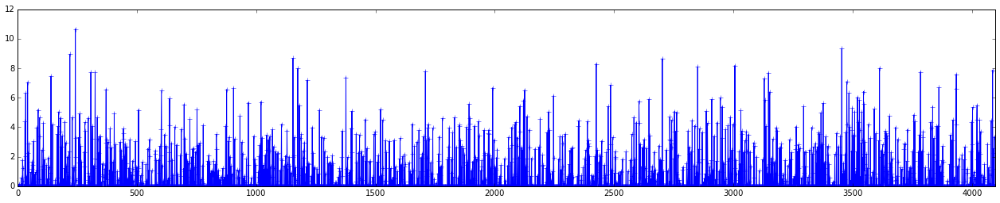

In [8]:
figure(figsize=(22,4))
da = list(images[images['__id'] == 71]['features'][0])
db = list(images[images['__id'] == 87]['features'][0])
diff = [abs(vb-va) for vb,va in zip(db,da)]
plot(range(4096), diff, marker='+', color='b')
xlim((0, 4096))
ylim((0,12))

In [9]:
images.filter_by([71, 26382] , '__id')['image'].show()

(0, 12)

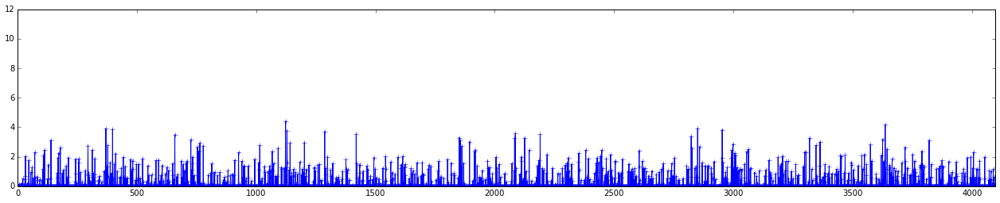

In [10]:
figure(figsize=(22,4))
da = list(images[images['__id'] == 71]['features'][0])
db = list(images[images['__id'] == 26382]['features'][0])
diff = [abs(vb-va) for vb,va in zip(db,da)]
plot(range(4096), diff, marker='+', color='b')
xlim((0, 4096))
ylim((0,12))

# Building the similarity graph using KNN

We want to build a similarity graph to investigate any naturally occuring patterns in the image. Similarity graphs are useful because we'd expect images of same types of rooms to be similar and be densely connected to one another on the graph, as opposed to images of different types of rooms.

To build the similarity graph, we start by building a nearest neighbor model and specifying cosine distance and the distance metric we are using. The cosine metic is used because of the sparse nature of the deep features that were extracted in the previous section. After building the nearest nehgbor model, we can go ahead and call the similarity_graph() method of the nearest neighbor class to build the graph.

In [11]:
model = gl.nearest_neighbors.create(images,  label='__id', features=['features'], distance='cosine')

PROGRESS: Starting brute force nearest neighbors model training.


In [12]:
model.query(images[images['__id'] == 71])

PROGRESS: Starting pairwise querying.
PROGRESS: +--------------+---------+-------------+--------------+
PROGRESS: | Query points | # Pairs | % Complete. | Elapsed Time |
PROGRESS: +--------------+---------+-------------+--------------+
PROGRESS: | 0            | 1       | 0.0476417   | 18.783ms     |
PROGRESS: | Done         |         | 100         | 193.901ms    |
PROGRESS: +--------------+---------+-------------+--------------+


query_label,reference_label,distance,rank
0,71,0.0,1
0,26382,0.1510588728,2
0,18728,0.158302988318,3
0,21286,0.16797610888,4
0,28815,0.170131729529,5


In [13]:
images.filter_by([71, 26382, 18728, 21286, 28815] , '__id')['image'].show()

In [14]:
sg = model.similarity_graph(k=None, radius=.2, include_self_edges=False, output_type='SFrame', verbose=True)

PROGRESS: Starting blockwise similarity graph construction.
PROGRESS: max rows per data block: 7668
PROGRESS: number of reference data blocks: 4
PROGRESS: +---------+-------------+--------------+
PROGRESS: | # Pairs | % Complete. | Elapsed Time |
PROGRESS: +---------+-------------+--------------+
PROGRESS: | 825301  | 29.9429     | 1.02s        |
PROGRESS: | 2202376 | 79.9048     | 2.28s        |
PROGRESS: | 2756250 | 100         | 2.92s        |
PROGRESS: +---------+-------------+--------------+


### Creating SGraph from the output

In [15]:
gg = gl.SGraph()
gg = gg.add_vertices(images)
gg = gg.add_edges(sg, src_field='query_label', dst_field='reference_label')

In [16]:
gg

SGraph({'num_edges': 33950, 'num_vertices': 2099})
Vertex Fields:['__id', 'image', 'features']
Edge Fields:['__src_id', '__dst_id', 'distance', 'rank']

## Visualizing the network using Matplotlib and NetworkX

To visually inspect the graph constructed, I use matplotlib and networkx to plot the graph using a spring layout. We can quickly notice clusters of images densely connected to one another. This indicates that maybe we should do some clustering on the data to associate different images with a set of clusters.

Note that the visualization here is not scaleable. Internally, the plotting library is doing some clustering to determine (x,y) coordinates. This makes it easier to identify clusters visually. Another way to approach the problem is to use a scaleable clustering algorithm (such as kmeans) right away without visualizing the data. This will yield similar but not exactly the same results as the clusters arising in the graph below.

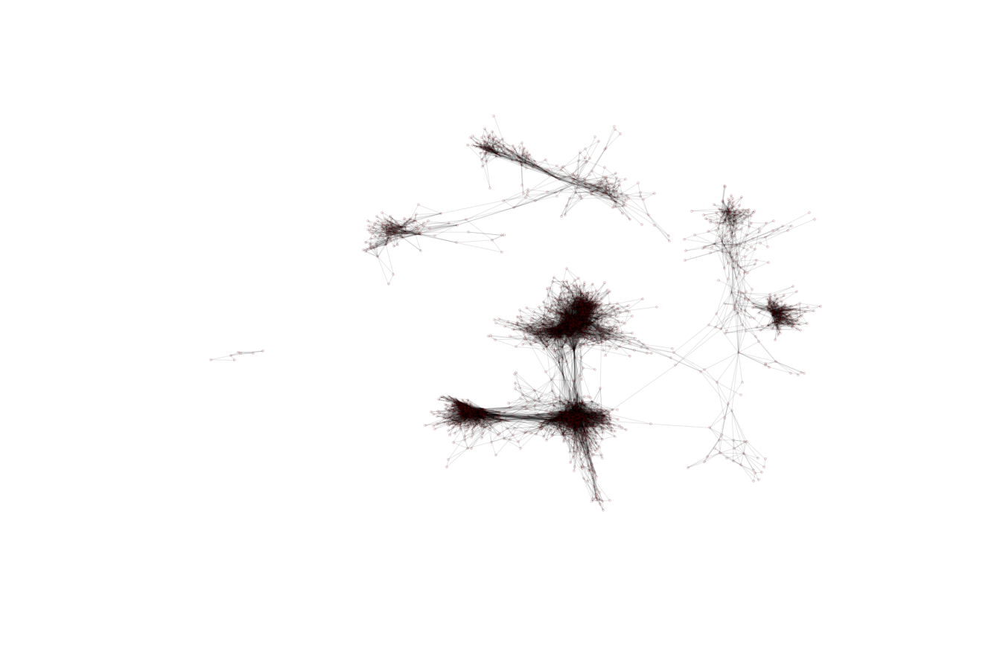

In [17]:
%matplotlib inline
G = nx.Graph()
G.add_nodes_from(list(gg.vertices['__id']))
G.add_weighted_edges_from([(k['__src_id'], k['__dst_id'], k['distance']) for k in list(gg.edges)])
figure(figsize=(18,12))
pos = nx.spring_layout(G)
nx.draw(G,pos, alpha=.1, node_size=10)

# Image Clustering Using Kmeans


In [18]:
model_kmeans = gl.kmeans.create(images, features=['features'], num_clusters=10)

PROGRESS: Initializing data.
PROGRESS: Batch size is larger than the input dataset. Switching to an exact Kmeans method.
PROGRESS: Choosing initial cluster centers with Kmeans++.
PROGRESS: +---------------+-----------+
PROGRESS: | Center number | Row index |
PROGRESS: +---------------+-----------+
PROGRESS: | 0             | 728       |
PROGRESS: | 1             | 1074      |
PROGRESS: | 2             | 259       |
PROGRESS: | 3             | 1890      |
PROGRESS: | 4             | 1130      |
PROGRESS: | 5             | 87        |
PROGRESS: +---------------+-----------+
PROGRESS: Starting kmeans model training.
PROGRESS: Assigning points to initial cluster centers.
PROGRESS: +-----------+-------------------------------+
PROGRESS: | Iteration | Number of changed assignments |
PROGRESS: +-----------+-------------------------------+
PROGRESS: | 1         | 359                           |
PROGRESS: | 2         | 293                           |
PROGRESS: | 3         | 165                 

In [96]:
model_kmeans['cluster_info'].print_rows(10)

+-------------------------------+------------+------+----------------------+
|            features           | cluster_id | size | sum_squared_distance |
+-------------------------------+------------+------+----------------------+
| [0.0, 0.755538888227, 0.13... |     0      | 459  |    499080.748413     |
| [0.0, 0.179623642241, 0.02... |     1      | 166  |    222311.026489     |
| [0.0, 0.127435424622, 0.0,... |     2      | 138  |    131640.974579     |
| [0.0, 0.215185662508, 0.0,... |     3      |  50  |     59171.899231     |
| [0.0, 0.665037724742, 0.09... |     4      | 187  |    224574.377319     |
| [0.0, 0.0, 0.0, 0.27393582... |     5      | 118  |    171552.223267     |
| [0.0, 0.509179809963, 0.10... |     6      | 207  |    264542.502686     |
| [0.027179918582, 0.3832342... |     7      | 285  |    369402.690186     |
| [0.0, 0.287922391592, 0.04... |     8      | 271  |    316941.194885     |
| [0.00436790410532, 2.02731... |     9      | 218  |    260685.611298     |

# Visual PageRank

After clustering, we still do not know what the clusters correspond to. We could sample randomly from each cluster and look at the sample to assign a label to the cluster, but this may not work very well. 

We can also select a small number of representative images in the cluster, and use them to label the cluster or label propagation. Using the similarity graph we derived, we can subset a subgraph of only the images that belong in a given cluster. We can then run PageRank on the subgraph to find the most representative images. We then assign a label to these images.

In [97]:
images = images.add_row_number()

def show_topk_pagerank(kmeans_model, graph, cluster_id, show_plot=True):
    # find all image ids in a given cluster
    ids = kmeans_model['cluster_id'].filter_by(cluster_id, 'cluster_id')['row_id']
    # initiate an SGraph
    subgraph = gl.SGraph()
    # add images to graph from the id's filtered above
    subgraph = subgraph.add_vertices(images.filter_by(ids, 'id'))
    # add edges that exist ONLY within the cluster
    subedges = graph.edges.filter_by(subgraph.vertices['__id'], '__src_id')
    subedges = subedges.filter_by(subgraph.vertices['__id'], '__dst_id')
    subgraph = subgraph.add_edges(subedges)
    # compute pagerank on subgraph
    pr = gl.pagerank.create(subgraph)
    # sort and show
    pr = pr['graph'].vertices.sort('pagerank', False)
    if show_plot:
        images.filter_by(pr[:9]['__id'], '__id')['image'].show()
    return pr[:9]['__id']

In [98]:
ids_0 = show_topk_pagerank(model_kmeans, gg, 0)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 235.362               |
PROGRESS: | 2         | 51.5685               |
PROGRESS: | 3         | 15.2032               |
PROGRESS: | 4         | 6.67094               |
PROGRESS: | 5         | 3.55469               |
PROGRESS: | 6         | 2.11737               |
PROGRESS: | 7         | 1.36807               |
PROGRESS: | 8         | 0.923696              |
PROGRESS: | 9         | 0.642731              |
PROGRESS: | 10        | 0.4563                |
PROGRESS: | 11        | 0.328618              |
PROGRESS: | 12        | 0.239291              |
PROGRESS: | 13        | 0.175632              |
PROGRESS: | 14        | 0.129833              |
PROGRESS: | 15        | 0.0964505             |
PROGRESS: | 16        | 0.0718879             |
PROGRESS: | 17        |

In [99]:
ids_2 = show_topk_pagerank(model_kmeans, gg, 2)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 59.2804               |
PROGRESS: | 2         | 15.3636               |
PROGRESS: | 3         | 4.90801               |
PROGRESS: | 4         | 2.27769               |
PROGRESS: | 5         | 1.20531               |
PROGRESS: | 6         | 0.686129              |
PROGRESS: | 7         | 0.406707              |
PROGRESS: | 8         | 0.24458               |
PROGRESS: | 9         | 0.148809              |
PROGRESS: | 10        | 0.0916331             |
PROGRESS: | 11        | 0.0570743             |
PROGRESS: | 12        | 0.0360316             |
PROGRESS: | 13        | 0.0228415             |
PROGRESS: | 14        | 0.0146102             |
PROGRESS: | 15        | 0.00938122            |
PROGRESS: +-----------+-----------------------+


In [100]:
ids_3 = show_topk_pagerank(model_kmeans, gg, 3)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 25.3799               |
PROGRESS: | 2         | 10.4642               |
PROGRESS: | 3         | 5.59031               |
PROGRESS: | 4         | 3.29818               |
PROGRESS: | 5         | 2.07005               |
PROGRESS: | 6         | 1.29031               |
PROGRESS: | 7         | 0.895684              |
PROGRESS: | 8         | 0.595753              |
PROGRESS: | 9         | 0.436888              |
PROGRESS: | 10        | 0.309284              |
PROGRESS: | 11        | 0.232138              |
PROGRESS: | 12        | 0.171398              |
PROGRESS: | 13        | 0.129887              |
PROGRESS: | 14        | 0.0969605             |
PROGRESS: | 15        | 0.0741633             |
PROGRESS: | 16        | 0.0553415             |
PROGRESS: | 17        |

In [69]:
ids_8 = show_topk_pagerank(model_kmeans, gg, 8)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 144.785               |
PROGRESS: | 2         | 37.9907               |
PROGRESS: | 3         | 11.4712               |
PROGRESS: | 4         | 4.77669               |
PROGRESS: | 5         | 2.35839               |
PROGRESS: | 6         | 1.39305               |
PROGRESS: | 7         | 0.867021              |
PROGRESS: | 8         | 0.600155              |
PROGRESS: | 9         | 0.413863              |
PROGRESS: | 10        | 0.304368              |
PROGRESS: | 11        | 0.219807              |
PROGRESS: | 12        | 0.166756              |
PROGRESS: | 13        | 0.123545              |
PROGRESS: | 14        | 0.0949767             |
PROGRESS: | 15        | 0.0711408             |
PROGRESS: | 16        | 0.0549642             |
PROGRESS: | 17        |

In [70]:
ids_7 = show_topk_pagerank(model_kmeans, gg, 7)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 166.745               |
PROGRESS: | 2         | 40.0171               |
PROGRESS: | 3         | 12.4411               |
PROGRESS: | 4         | 5.70245               |
PROGRESS: | 5         | 3.05288               |
PROGRESS: | 6         | 1.92503               |
PROGRESS: | 7         | 1.18366               |
PROGRESS: | 8         | 0.802474              |
PROGRESS: | 9         | 0.511601              |
PROGRESS: | 10        | 0.358257              |
PROGRESS: | 11        | 0.231548              |
PROGRESS: | 12        | 0.164827              |
PROGRESS: | 13        | 0.107517              |
PROGRESS: | 14        | 0.0776449             |
PROGRESS: | 15        | 0.0506976             |
PROGRESS: | 16        | 0.0367011             |
PROGRESS: | 17        |

In [71]:
ids_9 = show_topk_pagerank(model_kmeans, gg, 9)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 107.743               |
PROGRESS: | 2         | 31.6482               |
PROGRESS: | 3         | 11.0245               |
PROGRESS: | 4         | 4.73009               |
PROGRESS: | 5         | 2.23235               |
PROGRESS: | 6         | 1.24433               |
PROGRESS: | 7         | 0.751772              |
PROGRESS: | 8         | 0.487455              |
PROGRESS: | 9         | 0.324657              |
PROGRESS: | 10        | 0.227165              |
PROGRESS: | 11        | 0.163141              |
PROGRESS: | 12        | 0.119402              |
PROGRESS: | 13        | 0.0897744             |
PROGRESS: | 14        | 0.0689249             |
PROGRESS: | 15        | 0.0541284             |
PROGRESS: | 16        | 0.0430048             |
PROGRESS: | 17        |

In [72]:
ids_1 = show_topk_pagerank(model_kmeans, gg, 1)


PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 91.8001               |
PROGRESS: | 2         | 31.4731               |
PROGRESS: | 3         | 13.0982               |
PROGRESS: | 4         | 6.52948               |
PROGRESS: | 5         | 3.66762               |
PROGRESS: | 6         | 2.26641               |
PROGRESS: | 7         | 1.52395               |
PROGRESS: | 8         | 1.10808               |
PROGRESS: | 9         | 0.845709              |
PROGRESS: | 10        | 0.673135              |
PROGRESS: | 11        | 0.543908              |
PROGRESS: | 12        | 0.443124              |
PROGRESS: | 13        | 0.364965              |
PROGRESS: | 14        | 0.301036              |
PROGRESS: | 15        | 0.249461              |
PROGRESS: | 16        | 0.207527              |
PROGRESS: | 17        |

In [73]:
ids_4 = show_topk_pagerank(model_kmeans, gg, 4)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 96.8195               |
PROGRESS: | 2         | 28.3106               |
PROGRESS: | 3         | 8.79238               |
PROGRESS: | 4         | 3.61089               |
PROGRESS: | 5         | 1.89695               |
PROGRESS: | 6         | 1.19514               |
PROGRESS: | 7         | 0.814865              |
PROGRESS: | 8         | 0.573157              |
PROGRESS: | 9         | 0.408796              |
PROGRESS: | 10        | 0.296115              |
PROGRESS: | 11        | 0.216344              |
PROGRESS: | 12        | 0.159593              |
PROGRESS: | 13        | 0.118743              |
PROGRESS: | 14        | 0.0889535             |
PROGRESS: | 15        | 0.0670374             |
PROGRESS: | 16        | 0.0508231             |
PROGRESS: | 17        |

In [74]:
ids_5 = show_topk_pagerank(model_kmeans, gg, 5)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 56.4459               |
PROGRESS: | 2         | 15.6912               |
PROGRESS: | 3         | 5.61985               |
PROGRESS: | 4         | 2.25873               |
PROGRESS: | 5         | 1.01688               |
PROGRESS: | 6         | 0.511688              |
PROGRESS: | 7         | 0.299072              |
PROGRESS: | 8         | 0.182985              |
PROGRESS: | 9         | 0.120286              |
PROGRESS: | 10        | 0.0793948             |
PROGRESS: | 11        | 0.0539724             |
PROGRESS: | 12        | 0.0368097             |
PROGRESS: | 13        | 0.0258061             |
PROGRESS: | 14        | 0.0181251             |
PROGRESS: | 15        | 0.0129171             |
PROGRESS: | 16        | 0.00919988            |
PROGRESS: +-----------+

In [75]:
ids_6 = show_topk_pagerank(model_kmeans, gg, 6)

PROGRESS: Counting out degree
PROGRESS: Done counting out degree
PROGRESS: +-----------+-----------------------+
PROGRESS: | Iteration | L1 change in pagerank |
PROGRESS: +-----------+-----------------------+
PROGRESS: | 1         | 105.251               |
PROGRESS: | 2         | 35.6027               |
PROGRESS: | 3         | 13.0351               |
PROGRESS: | 4         | 6.47001               |
PROGRESS: | 5         | 3.1266                |
PROGRESS: | 6         | 1.90267               |
PROGRESS: | 7         | 1.10741               |
PROGRESS: | 8         | 0.728731              |
PROGRESS: | 9         | 0.46528               |
PROGRESS: | 10        | 0.318776              |
PROGRESS: | 11        | 0.217481              |
PROGRESS: | 12        | 0.153736              |
PROGRESS: | 13        | 0.109297              |
PROGRESS: | 14        | 0.0796753             |
PROGRESS: | 15        | 0.0583938             |
PROGRESS: | 16        | 0.0435976             |
PROGRESS: | 17        |

After running PageRank on every cluster and seeing very uniform results per cluster, I go ahead and assign labels to each cluster based on my interpretation of the representative images of each cluster.

In [101]:
dict_labels= { 7: 'kitchen', 
               9: 'outdoors', 
               4: 'bathroom',
               8: 'bathroom',
               2: 'plans', 
               0: 'empty_rooms', 
               1: 'living_room', 
               5: 'front_house_style_a', 
               6: 'empty_rooms_with_windows',
               3: 'front_house_style_b'}

def assign_labels_to_nodes(dict_labels, kmeans_model):
    for cluster_id in range(10):
        ids = kmeans_model['cluster_id'].filter_by(cluster_id, 'cluster_id')['row_id']
        cluster_images = images.filter_by(ids, 'id')
        graph_ids = list(cluster_images['__id'])
        
        for node in graph_ids:
            G.node[node]['category'] = dict_labels[cluster_id]


In [102]:
assign_labels_to_nodes(dict_labels, model_kmeans)

color_map = {'bathroom': '#4c36d9',
             'empty_rooms': '#f20000',
             'empty_rooms_with_windows': '#ffd580',
             'front_house_style_a': '#a63a29',
             'front_house_style_b': '#000f73',
             'kitchen': '#00735c',
             'living_room': '#33001b',
             'outdoors': '#f2a200',
             'plans': '#00e6b8'}

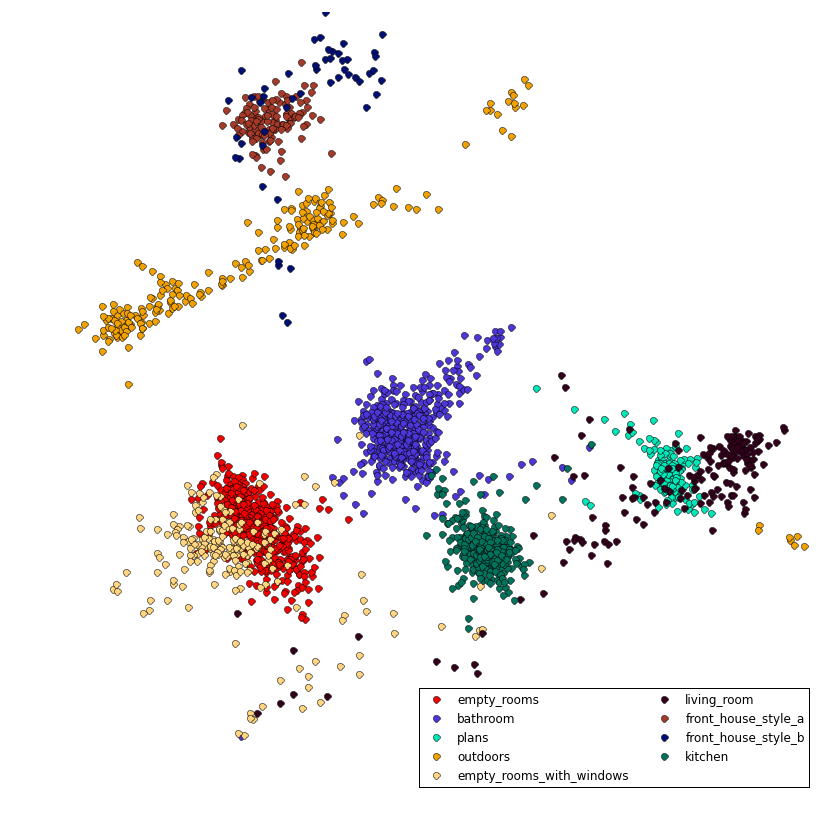

In [103]:
figure(figsize=(14,14))
axis('off')

coor = gl.SFrame({"x": [v[0] for v in pos.values()],
                  "y": [v[1] for v in pos.values()],
                  "c": [G.node[k]['category'] for k in pos.keys()]})

for cat, col in color_map.iteritems():
    si = coor[coor['c'] == cat]
    plot(si['x'], si['y'], color=col, marker='o', linestyle='', ms=7, label=cat)


legend(loc=0, numpoints=1, ncol=2)